# Import Library

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import folium

# Import Data

In [2]:
df_kuota = pd.read_csv('dataset/data_kuota.csv',sep=';',decimal=',')
df_rapor = pd.read_csv('dataset/data_rapor.csv',sep=';',decimal=',')
df_zonasi = pd.read_csv('dataset/data_zonasi.csv',sep=';',decimal=',')
df_koor = pd.read_csv('dataset/data_koordinat.csv',sep=';',decimal=',')
df_indeks = pd.read_csv('dataset/ik-berdasarkan-aspek-dan-kecamatan-2018.csv',sep=',',decimal='.')

# Data Cleansing

In [3]:
kuota_clean = df_kuota.astype({'sekolah_jalur':'string'}).replace('-', np.NaN)

rapor_clean = df_rapor.astype({'nomor_pendaftar':'string',
                               'nama':'string',
                               'pilihan_1':'string',
                               'pilihan_2':'string',
                               'pilihan_3':'string',}).replace('-', np.NaN)

zonasi_clean = df_zonasi.astype({'nomor_pendaftar':'string',
                               'nama':'string',
                               'pilihan_1':'string',
                               'pilihan_2':'string',
                               'pilihan_3':'string',}).replace('-', np.NaN)

koor_clean = df_koor[['nama_sekolah','lon','lat']]
koor_clean.columns = ['nama_sekolah','lat','lon']

indeks_clean = df_indeks.astype({'Nama Kecamatan':'string'})
indeks_clean.columns = ['nama_kecamatan',
                        'hubungan_sosial',
                        'keamanan',
                        'keharmonisan_keluarga',
                        'kesehatan','waktu_luang',
                        'lingkungan','pekerjaan',
                        'pendapatan',
                        'pendidikan',
                        'religi',
                        'rumah_fasilitias']

In [4]:
indeks_clean

,nama_kecamatan,hubungan_sosial,keamanan,keharmonisan_keluarga,kesehatan,waktu_luang,lingkungan,pekerjaan,pendapatan,pendidikan,religi,rumah_fasilitias
0,Andir,77.41,82.22,83.04,81.93,78.22,82.15,75.48,73.70,74.59,91.56,78.52
1,Antapani,73.12,74.40,73.12,72.12,70.73,74.01,72.22,71.83,69.74,86.81,72.52
2,Arcamanik,76.40,77.09,79.50,74.91,73.08,77.78,74.23,71.94,71.25,95.53,74.46
3,Astanaanyar,75.91,79.83,80.21,77.59,75.72,80.49,73.02,73.95,72.64,95.80,76.28
4,Babakan Ciparay,72.57,72.20,76.59,72.68,69.27,74.85,69.70,67.97,68.08,87.26,72.03
5,Bandung Kidul,77.43,78.59,79.22,76.50,77.03,78.13,75.46,74.48,74.71,95.83,78.07
6,Bandung Kulon,73.65,75.14,78.60,74.20,72.88,74.75,71.01,69.03,70.57,91.25,72.28
7,Bandung Wetan,71.62,73.22,73.77,71.02,68.30,75.35,74.54,67.56,65.93,78.43,71.74
8,Batununggal,76.87,78.63,77.29,76.44,74.38,76.44,71.40,70.98,72.92,87.31,73.22
9,Bojongloa Kaler,71.88,74.80,75.89,72.79,72.68,75.54,71.76,68.50,69.36,90.15,70.50


# Combine Data

Kombinasi Data rapor (negeri)

In [5]:
rapor_part1=rapor_clean[['nomor_pendaftar',
                         'nama','pilihan_1',
                         'skor']]
rapor_part2=rapor_clean[['nomor_pendaftar',
                         'nama','pilihan_2',
                         'skor']]

In [6]:
rapor_part1.columns = ['nomor_pendaftar',
                       'nama',
                       'pilihan',
                       'skor']
rapor_part2.columns = ['nomor_pendaftar',
                       'nama',
                       'pilihan',
                       'skor']

In [7]:
rapor_combine = pd.concat([rapor_part1,rapor_part2])

Kombinasi Data Zonasi (negeri)

In [8]:
zonasi_part1=zonasi_clean[['nomor_pendaftar',
                           'nama','pilihan_1',
                           'jarak_1']]
zonasi_part2=zonasi_clean[['nomor_pendaftar'
                           ,'nama','pilihan_2',
                           'jarak_2']]

In [9]:
zonasi_part1.columns = ['nomor_pendaftar',
                        'nama',
                        'pilihan',
                        'jarak']
zonasi_part2.columns = ['nomor_pendaftar',
                        'nama',
                        'pilihan',
                        'jarak']

In [10]:
zonasi_combine = pd.concat([zonasi_part1,zonasi_part2])

# Preparation for Visualisation

Kuota rapor dan zonasi

In [11]:
k_rapor = {}
for n in range(1, 28):
    k_rapor[n] = kuota_clean['kuota'][kuota_clean['sekolah_jalur'] == 'SMAN {0} BANDUNG - PRESTASI RAPOR'.format(n)].values[0]
    
k_zonasi = {}
for n in range(1, 28):
    k_zonasi[n] = kuota_clean['kuota'][kuota_clean['sekolah_jalur'] == 'SMAN {0} BANDUNG - ZONASI'.format(n)].values[0]

In [12]:
k_zonasi

{1: 170,
 2: 151,
 3: 165,
 4: 165,
 5: 170,
 6: 165,
 7: 166,
 8: 165,
 9: 119,
 10: 200,
 11: 200,
 12: 162,
 13: 175,
 14: 102,
 15: 183,
 16: 168,
 17: 175,
 18: 167,
 19: 172,
 20: 149,
 21: 164,
 22: 181,
 23: 148,
 24: 132,
 25: 198,
 26: 149,
 27: 200}

Passing Grade

In [13]:
#passing grade rapor
pg_rapor = {}
for n in range(1, 28):
    pg_rapor[n] = rapor_combine['skor'][rapor_combine['pilihan'] == 'SMAN {0} BANDUNG - PRESTASI RAPOR'.format(n)].sort_values(ascending=False).iloc[[k_rapor.get(n)]].values[0]
    
#passing grade zonasi
pg_zonasi = {}
for n in range(1, 28):
    pg_zonasi[n] = zonasi_clean['jarak_1'][zonasi_clean['pilihan_1'] == 'SMAN {0} BANDUNG - ZONASI'.format(n)].sort_values(ascending=True).iloc[[k_zonasi.get(n)]].values[0]

In [14]:
pg_zonasi

{1: 917.285,
 2: 582.431,
 3: 772.782,
 4: 829.087,
 5: 990.765,
 6: 1137.041,
 7: 1262.823,
 8: 553.762,
 9: 563.418,
 10: 553.412,
 11: 820.182,
 12: 969.522,
 13: 712.591,
 14: 324.473,
 15: 722.14,
 16: 612.847,
 17: 706.712,
 18: 625.246,
 19: 901.922,
 20: 978.515,
 21: 1909.292,
 22: 2271.617,
 23: 576.606,
 24: 515.381,
 25: 1082.38,
 26: 675.422,
 27: 2133.713}

In [15]:
pg_rapor

{1: 459.909,
 2: 464.182,
 3: 473.545,
 4: 451.455,
 5: 469.0,
 6: 441.727,
 7: 436.0,
 8: 466.273,
 9: 445.818,
 10: 441.455,
 11: 447.727,
 12: 452.636,
 13: 433.909,
 14: 441.6,
 15: 442.909,
 16: 427.545,
 17: 428.273,
 18: 428.091,
 19: 429.455,
 20: 456.818,
 21: 427.455,
 22: 449.818,
 23: 445.455,
 24: 452.364,
 25: 439.182,
 26: 439.273,
 27: 431.364}

# Visualisation

Visualisasi Zonasi

In [16]:
nama_zonasi = list(pg_zonasi.keys())
nilai_zonasi = list(pg_zonasi.values())

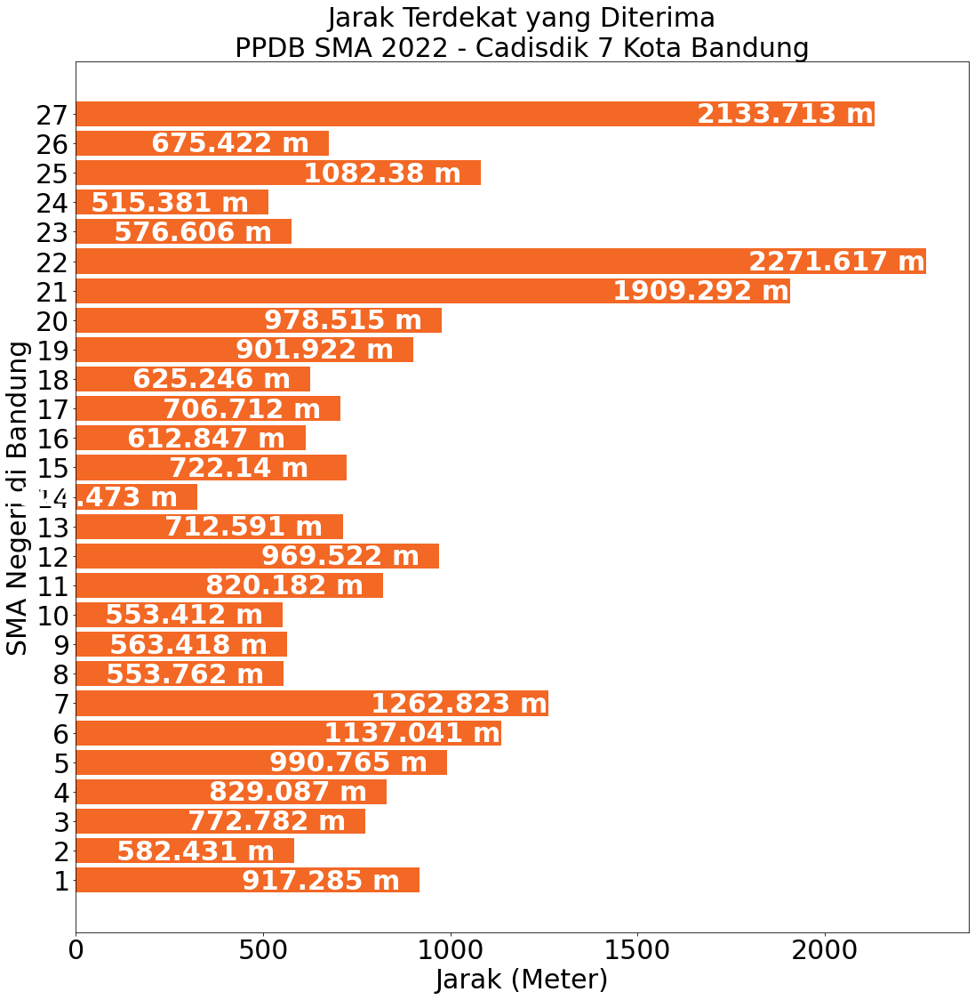

In [70]:
plt.figure(figsize=(18,18))
plt.barh(range(len(pg_zonasi)), nilai_zonasi, tick_label=nama_zonasi, height = 0.85, align = 'center',color=('#F36825'))
plt.xlabel('Jarak (Meter)',size = 30)
plt.ylabel('SMA Negeri di Bandung',size = 30)
plt.title('Jarak Terdekat yang Diterima\nPPDB SMA 2022 - Cadisdik 7 Kota Bandung',size = 30)
plt.xticks(size = 30)
plt.yticks(size = 30)

for i, v in enumerate(nilai_zonasi):
    plt.text(v - 475, i - 0.3, str(v) + str(' m'), color = 'white', fontweight = 'bold',size = 30)

Visualisasi Radius Penerimaan

In [18]:
borderStyle ={
    'color' : 'black',
    'weight' : 1,
    'fillOpacity' : 0
}

m = folium.Map(location=[-6.917383125143132, 107.64908852395877], tiles="CartoDB positron",zoom_start=12,zoom_control=False,scrollWheelZoom=False,dragging=False)

folium.GeoJson('geojson-bandung-master/3273-kota-bandung-level-kecamatan.json', 
               name = 'Batas Kecamatan',
               style_function = lambda x: borderStyle).add_to(m)

In [71]:
for i in range(0,len(koor_clean)):
   folium.Circle(
      location=[koor_clean.iloc[i]['lat'], koor_clean.iloc[i]['lon']],
      popup=koor_clean.iloc[i]['nama_sekolah'],
      radius=pg_zonasi.get(i+1),
      color='#F36825',
      fill=True,
      fill_color='#F36825',
      weight = 2
   ).add_to(m)

In [72]:
m

Visualisasi Indeks Pendapatan

In [21]:
m_1 = folium.Map(location=[-6.917383125143132, 107.64908852395877], tiles="CartoDB positron",zoom_start=12,zoom_control=False,scrollWheelZoom=False,dragging=False)

folium.Choropleth(
    geo_data = 'geojson-bandung-master/3273-kota-bandung-level-kecamatan.json',
    data = indeks_clean,
    columns=['nama_kecamatan','rumah_fasilitias'],
    key_on='feature.properties.nama_kecamatan',
    legend_name = 'Indeks Kebahagiaan Berdasarkan Rumah dan Fasilitas Rumah',
    fill_color='Spectral'
).add_to(m_1)

In [22]:
m_1

In [23]:
for i in range(0,len(koor_clean)):
   folium.Circle(
      location=[koor_clean.iloc[i]['lat'], koor_clean.iloc[i]['lon']],
      popup=koor_clean.iloc[i]['nama_sekolah'],
      radius=pg_zonasi.get(i+1),
      color='red',
      fill=True,
      fill_color='red',
      weight = 2
   ).add_to(m_1)

In [24]:
m_1

In [25]:
m_2 = folium.Map(location=[-6.917383125143132, 107.64908852395877], tiles="CartoDB positron",zoom_start=12,zoom_control=False,scrollWheelZoom=False,dragging=False)

folium.Choropleth(
    geo_data = 'geojson-bandung-master/3273-kota-bandung-level-kecamatan.json',
    data = indeks_clean,
    columns=['nama_kecamatan','pendapatan'],
    key_on='feature.properties.nama_kecamatan',
    legend_name = 'Indeks Kebahagiaan Berdasarkan Pendapatan',
    fill_color='Spectral'
).add_to(m_2)

In [26]:
m_2

In [27]:
for i in range(0,len(koor_clean)):
   folium.Circle(
      location=[koor_clean.iloc[i]['lat'], koor_clean.iloc[i]['lon']],
      popup=koor_clean.iloc[i]['nama_sekolah'],
      radius=pg_zonasi.get(i+1),
      color='red',
      fill=True,
      fill_color='red',
      weight = 2
   ).add_to(m_2)

In [28]:
m_2

In [29]:
m_3 = folium.Map(location=[-6.917383125143132, 107.64908852395877], tiles="CartoDB positron",zoom_start=12,zoom_control=False,scrollWheelZoom=False,dragging=False)

folium.Choropleth(
    geo_data = 'geojson-bandung-master/3273-kota-bandung-level-kecamatan.json',
    data = indeks_clean,
    columns=['nama_kecamatan','pendidikan'],
    key_on='feature.properties.nama_kecamatan',
    legend_name = 'Indeks Kebahagiaan Berdasarkan Pendidikan',
    fill_color='Spectral'
).add_to(m_3)

In [30]:
m_3

In [31]:
for i in range(0,len(koor_clean)):
   folium.Circle(
      location=[koor_clean.iloc[i]['lat'], koor_clean.iloc[i]['lon']],
      popup=koor_clean.iloc[i]['nama_sekolah'],
      radius=pg_zonasi.get(i+1),
      color='red',
      fill=True,
      fill_color='red',
      weight = 2
   ).add_to(m_3)

In [32]:
m_3

Visualisasi Rapor

In [33]:
nama_rapor = list(pg_rapor.keys())
nilai_rapor = list(pg_rapor.values())

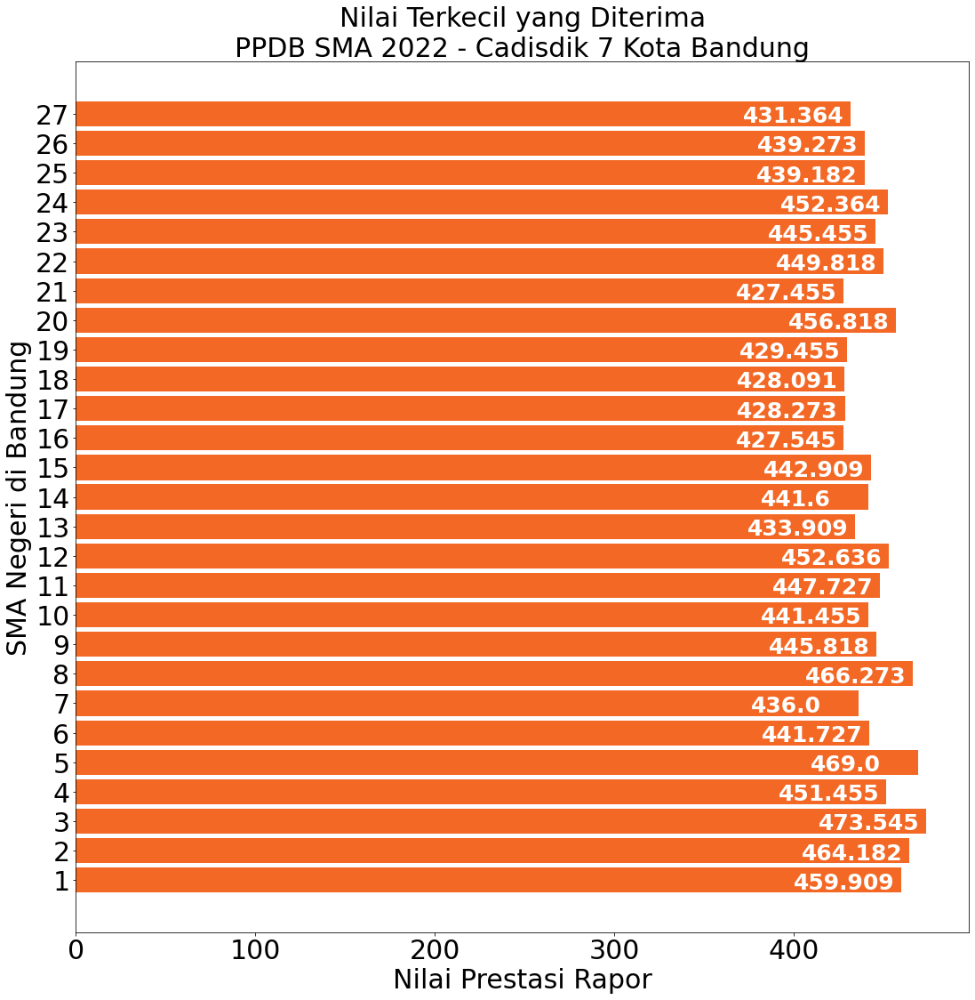

In [56]:
plt.figure(figsize=(18,18))
plt.barh(range(len(pg_rapor)), nilai_rapor, tick_label=nama_rapor, height = 0.85, align = 'center',color=('#F36825'))
plt.xlabel('Nilai Prestasi Rapor',size = 30)
plt.ylabel('SMA Negeri di Bandung',size = 30)
plt.title('Nilai Terkecil yang Diterima\nPPDB SMA 2022 - Cadisdik 7 Kota Bandung',size = 30)
plt.xticks(size = 30)
plt.yticks(size = 30)

for i, v in enumerate(nilai_rapor):
    plt.text(v - 60, i - 0.3, str(v), color = 'white', fontweight = 'bold', size = 25)

Visualisasi Pesebaran Nilai

In [35]:
statistik_rapor = rapor_clean['skor'].describe([0.01,0.02,0.16,0.50,0.84,0.98,0.99])

(array([  0.,  50., 100., 150., 200., 250., 300., 350.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

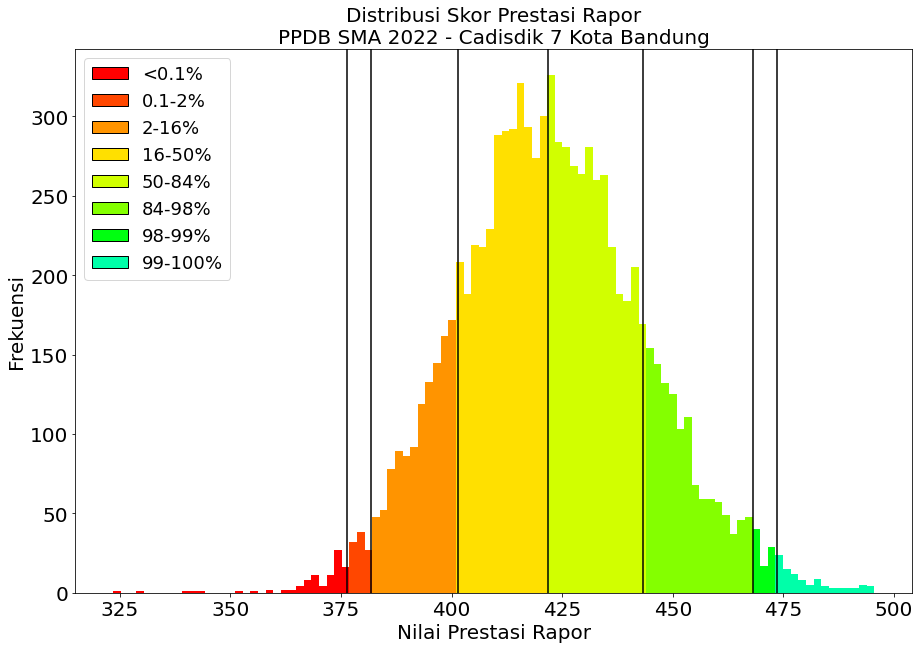

In [52]:
plt.figure(figsize=(15,10))
N, bins, patches = plt.hist(rapor_clean['skor'],bins=100)

cmap = plt.get_cmap('hsv')
cmapwarna=[cmap(0),cmap(0.05),cmap(0.1),cmap(0.15),cmap(0.20),cmap(0.25),cmap(0.35),cmap(0.45)]
for i in range(0,31):
    patches[i].set_facecolor(cmapwarna[0])
for i in range(31,34):
    patches[i].set_facecolor(cmapwarna[1])
for i in range(34,45):
    patches[i].set_facecolor(cmapwarna[2])
for i in range(45,57):
    patches[i].set_facecolor(cmapwarna[3])
for i in range(57,70):
    patches[i].set_facecolor(cmapwarna[4])
for i in range(70,84):
    patches[i].set_facecolor(cmapwarna[5])
for i in range(84,87):
    patches[i].set_facecolor(cmapwarna[6])
for i in range(87,100):
    patches[i].set_facecolor(cmapwarna[7])

plt.axvline(statistik_rapor['1%'],color='k')
plt.axvline(statistik_rapor['2%'],color='k')
plt.axvline(statistik_rapor['16%'],color='k')
plt.axvline(statistik_rapor['50%'],color='k')
plt.axvline(statistik_rapor['84%'],color='k')
plt.axvline(statistik_rapor['98%'],color='k')
plt.axvline(statistik_rapor['99%'],color='k')

handles = [Rectangle((0, 0), 1, 1, color=c, ec="k") for c in cmapwarna]
labels = ["<0.1%", "0.1-2%", "2-16%","16-50%","50-84%","84-98%","98-99%","99-100%"]
plt.legend(handles, labels, fontsize=18)

plt.title('Distribusi Skor Prestasi Rapor\nPPDB SMA 2022 - Cadisdik 7 Kota Bandung',size = 20)
plt.ylabel('Frekuensi',size = 20)
plt.xlabel('Nilai Prestasi Rapor',size = 20)
plt.xticks(size = 20)
plt.yticks(size = 20)